In [63]:
import plotly.graph_objects as go
import pickle

import numpy as np
import pickle
import pandas as pd

import chart_studio.plotly as py
import plotly as py2
from chart_studio.plotly import iplot

from plotly.offline import plot
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [64]:
def save_html(html_str, title):
    html = open("../results/" + title + ".html","w")
    html.write(html_str)
    html.close()

## 1 Food parser
TODO: slide parser


## 3 A mass of food

In [65]:
tot_weight_nut_df = pd.read_pickle('../saved_data/tot_weight_nut_df.pickle') 
overall_massnut = pd.read_pickle('../saved_data/total_mass_nutrients.pickle')
N = 200
shorter_df = tot_weight_nut_df.head(N).copy()

nutriments = np.array(['carbohydrate', 'cholesterol', 'energy',
       'fatty acids total polyunsaturated', 'fatty acids total saturated',
       'fiber', 'protein', 'sodium', 'sugars', 'total lipid'])

nut_units = pd.read_pickle("../saved_data/nutriments_units.pickle").set_index('name')

In [68]:
tot_weight_nut_df = tot_weight_nut_df.drop(index=0)

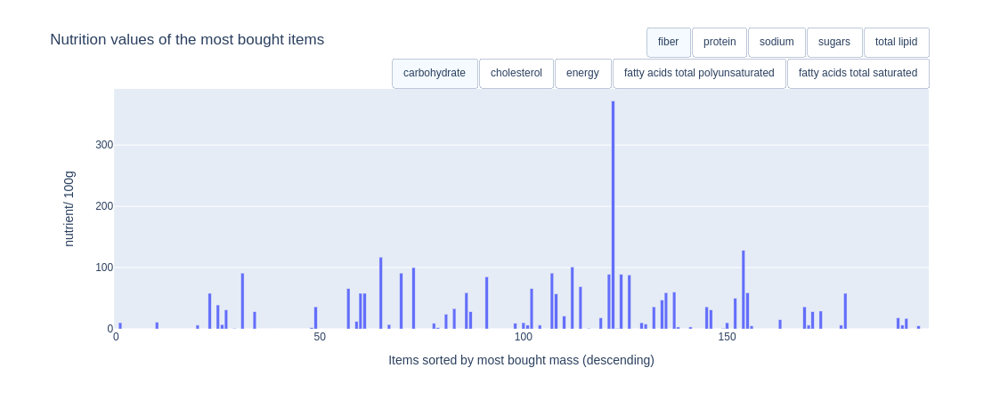

In [85]:
import plotly.graph_objects as go

import pandas as pd
# Initialize figure
fig = go.Figure()

# Add Traces
nut_bools = {}
for i,nut in enumerate(nutriments):
    k = [False] * len(nutriments)
    k[i] = True
    fig.add_trace(
        go.Bar(name='',
               y=shorter_df[nut].values,
               hoverinfo  ='text',
               hovertext = shorter_df[nut].astype(str).values + " " +nut_units.loc[nut][1] + "/100g."
               + '<br>article:' +shorter_df.dunn_name.values 
               + '<br>parsed name:' + shorter_df.nut_name.values
               + '<br>tot bought mass:' + shorter_df.TOT_WEIGHT.round(1).astype(str).values + "kg.",
              visible = i == 1)
    )
    nut_bools[nut] = k

fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.13,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[:5]])),
       go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.26,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {'xaxis': {'title': nut + ':' +nut_units.loc[nut][1]}},
                           {"annotations": []}]) for nut in nutriments[5:]]))
    ])

# Set title
fig.update_layout(
    showlegend=False,
    title_text="Nutrition values of the most bought items",
    xaxis_domain=[0.05, 1.0],
    xaxis_title="Items sorted by most bought mass (descending)",
    yaxis_title="nutrient/ 100g"

)

fig.show()
#plotly.offline.plot(fig, filename='name.html')

In [86]:
html_str = py2.offline.plot(fig, include_plotlyjs=True, output_type='div')
save_html(html_str, "../results/Mass_sorted_items")

## 4 Mass responsability

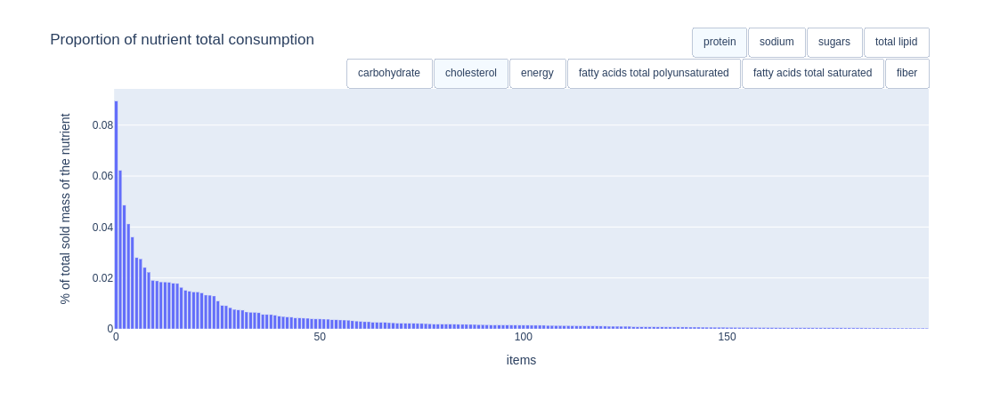

In [89]:
# Initialize figure
fig = go.Figure()

# Add Traces
nut_bools = {}
for i,nut in enumerate(nutriments):
    k = [False] * len(nutriments)
    k[i] = True        
    fig.add_trace(
        go.Bar(name='',
               y=tot_weight_nut_df.sort_values('tot_' + nut,ascending = False)['tot_' + nut].head(N) / overall_massnut.loc['tot_'+nut],
               hoverinfo  ='text',
               hovertext = (tot_weight_nut_df.sort_values('tot_' + nut,ascending = False)['tot_' + nut] / overall_massnut.loc['tot_'+nut] * 100).round(3).head(N).astype(str).values + " %"
               + '<br>article:' +tot_weight_nut_df.sort_values('tot_' + nut,ascending = False).head(N).dunn_name.values 
               + '<br>parsed name:' + tot_weight_nut_df.sort_values('tot_' + nut,ascending = False).head(N).nut_name.values
              ,visible = i==1)
    )
              # + '<br>' +tot_weight_nut_df[])
    nut_bools[nut] = k

fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=1,
            showactive = True,
            x=1,
            y=1.13,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[:6]])),
       go.layout.Updatemenu(
            type="buttons",
            direction="right",
            x=1,
            y=1.26,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[6:]]))
    ])

# Set title
fig.update_layout(
    showlegend=False,
    title_text="Proportion of nutrient total consumption",
    xaxis_domain=[0.05, 1.0],
    xaxis_title="items",
    yaxis_title="% of total sold mass of the nutrient"

)

fig.show()

In [90]:
#iplot(figure, validate=True)
html_str = py2.offline.plot(fig, include_plotlyjs=True, output_type='div')
save_html(html_str, "../results/nutrient_responsability")

## 5 Fat graph

In [74]:
#cf Demographic_Nut

## 6 Outliers detection

In [75]:
with open('../saved_data/quantiles_outliers.pickle','rb') as f:
    quantiles = pickle.load(f)
with open('../saved_data/avg_nutriments.pickle','rb') as f:
    avg_nutriments = pickle.load(f)
hshold_dtction_df = pd.read_pickle('../saved_data/hshold_dtction_df.pickle')

In [76]:
avg_nutriments = ['avg_' + nut for nut in nutriments]

In [77]:
def get_outliers(avg_nutriment,quantiles,df):
    """
    avg_nutriment: the nutriment for which we calculate an excess starting with string 'avg_'
    quantiles: the quantiles dictionary (for all nutriments)
    df: the dataframe linking the average nutriments consumptions to housholds ids
    """
    outliers_df = df[df[avg_nutriment] > quantiles[avg_nutriment]['high_lim']]
    return outliers_df.index

In [78]:
nutriment_data = hshold_dtction_df[avg_nutriments].values
nutriment_data = StandardScaler().fit_transform(nutriment_data)
pca = PCA(n_components=3)
pca.fit(nutriment_data)
nutriment_data = pca.transform(nutriment_data)
list_outlier = get_outliers('avg_sodium',quantiles,hshold_dtction_df)
list_outlier = list_outlier -1

In [79]:
nut_outindx_dic = {}
for nut in nutriments:
    # we subtract 1 to obtain the index
    list_outlier = list_outlier = get_outliers('avg_' + nut,quantiles,hshold_dtction_df) -1
    bool_list = np.array([False] * nutriment_data.shape[0])
    bool_list[list_outlier] = True
    nut_outindx_dic[nut] = bool_list


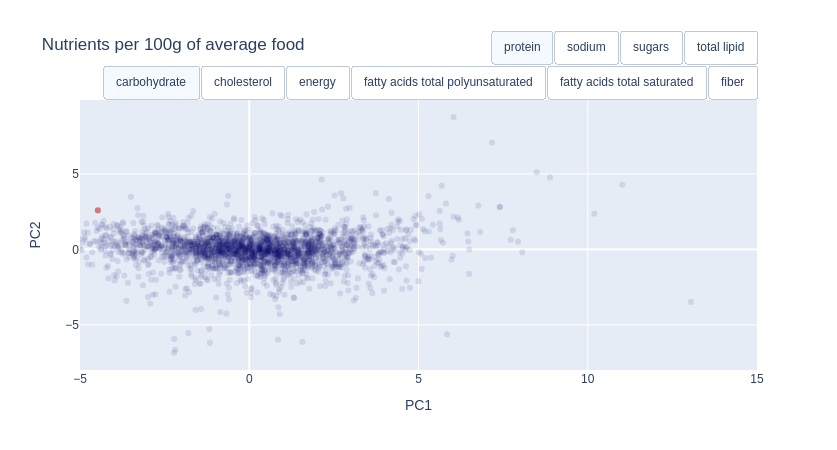

In [80]:
# Initialize figure
fig = go.Figure()

# Add Traces
nut_bools = {}
for i,nut in enumerate(nutriments):
    k = [False] * 2 * (len(nutriments) + 1)
    k[2*i] = True
    k[2*i+1] = True
    fig.add_trace(
        go.Scatter(x = nutriment_data[~nut_outindx_dic[nut]][:,0],
                   y = nutriment_data[~nut_outindx_dic[nut]][:,1],
                   mode = 'markers',
                   marker_color='rgba(0, 0, 100, .1)',
                   hoverinfo = 'text',
                   hovertext = (hshold_dtction_df[~nut_outindx_dic[nut]]['avg_'+nut].round(2).astype(str).values+ " " + nut_units.loc[nut][1]
                               + '<br> id:'+ hshold_dtction_df.index[~nut_outindx_dic[nut]].astype(str).values),
                   visible = i == 0
        )
    )
    fig.add_trace(
        go.Scatter(x = nutriment_data[nut_outindx_dic[nut]][:,0],
                   y = nutriment_data[nut_outindx_dic[nut]][:,1],
                   mode = 'markers',
                   marker_color='rgba(200, 0, 0, .5)',
                   hoverinfo  ='text',
                   hovertext = (hshold_dtction_df[nut_outindx_dic[nut]]['avg_'+nut].round(2).astype(str).values+ " " + nut_units.loc[nut][1]
                                 + '<br> id:'+ hshold_dtction_df.index[nut_outindx_dic[nut]].astype(str).values),
                   visible = i == 0

                  )
    )
    nut_bools[nut] = k

fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.13,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[:6]])),
       go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.26,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[6:]]))
    ])

# Set title
fig.update_layout(
    title_text="Nutrients per 100g of average food",
    xaxis_domain=[1.0, 0.05],
    xaxis=dict(range=[-5, 15]),
    showlegend=False,
    xaxis_title="PC1",
    yaxis_title="PC2"
)
fig.show()

In [81]:
html_str = py2.offline.plot(fig, include_plotlyjs=True, output_type='div')
save_html(html_str, "../results/Outliers_detection")

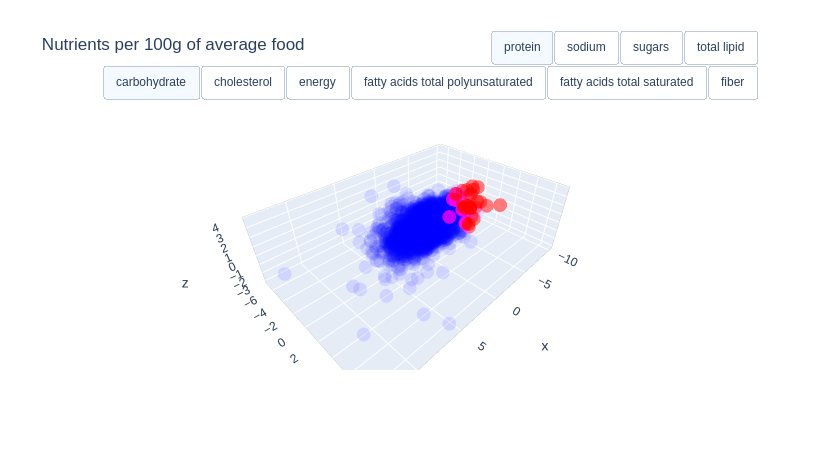

In [82]:
# Initialize figure
fig = go.Figure()

# Add Traces
nut_bools = {}
for i,nut in enumerate(nutriments):
    k = [False] * 2 * (len(nutriments) + 1)
    k[2*i] = True
    k[2*i+1] = True
    fig.add_trace(
        go.Scatter3d(x = nutriment_data[~nut_outindx_dic[nut]][:,0],
                   y = nutriment_data[~nut_outindx_dic[nut]][:,1],
                   z = nutriment_data[~nut_outindx_dic[nut]][:,2],
                   mode = 'markers',
                   marker_color='rgba(0, 0, 100, .1)',
                   hoverinfo = 'text',
                   hovertext = (hshold_dtction_df[~nut_outindx_dic[nut]]['avg_'+nut].round(2).astype(str).values+ " " + nut_units.loc[nut][1]
                               + '<br> id:'+ hshold_dtction_df.index[~nut_outindx_dic[nut]].astype(str).values),
                   visible = i == 0
        )
    )
    fig.add_trace(
        go.Scatter3d(x = nutriment_data[nut_outindx_dic[nut]][:,0],
                   y = nutriment_data[nut_outindx_dic[nut]][:,1],
                   z = nutriment_data[nut_outindx_dic[nut]][:,2],
                   mode = 'markers',
                   marker_color='rgba(200, 0, 0, .5)',
                   hoverinfo  ='text',
                   hovertext = (hshold_dtction_df[nut_outindx_dic[nut]]['avg_'+nut].round(2).astype(str).values+ " " + nut_units.loc[nut][1]
                                 + '<br> id:'+ hshold_dtction_df.index[nut_outindx_dic[nut]].astype(str).values),
                   visible = i == 0

                  )
    )
    nut_bools[nut] = k

fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.13,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[:6]])),
       go.layout.Updatemenu(
            type="buttons",
            direction="right",
            active=0,
            x=1,
            y=1.26,
            buttons=list([
                dict(label= nut,
                     method="update",
                     args=[{"visible": nut_bools[nut]},
                           {"annotations": []}]) for nut in nutriments[6:]]))
    ])

# Set title
fig.update_layout(
    title_text="Nutrients per 100g of average food",
    xaxis_domain=[1.0, 0.05],
    xaxis=dict(range=[-5, 15]),
    showlegend=False,
    xaxis_title="PC1",
    yaxis_title="PC2"
)
fig.show()

In [83]:
html_str = py2.offline.plot(fig, include_plotlyjs=True, output_type='div')
save_html(html_str, "../results/Outliers_detection3D")